### Import necessary libs

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn

In [2]:
# Load dataset
df= pd.read_csv("home_data.csv")
df.info()
df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  int64  
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21613 non-null  int64  
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


/var/folders/rq/17pdd6tn0q7cl934rk8rr1f40000gn/T/ipykernel_183/2555401386.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plots[col] = plt.figure(figsize=(10,6))


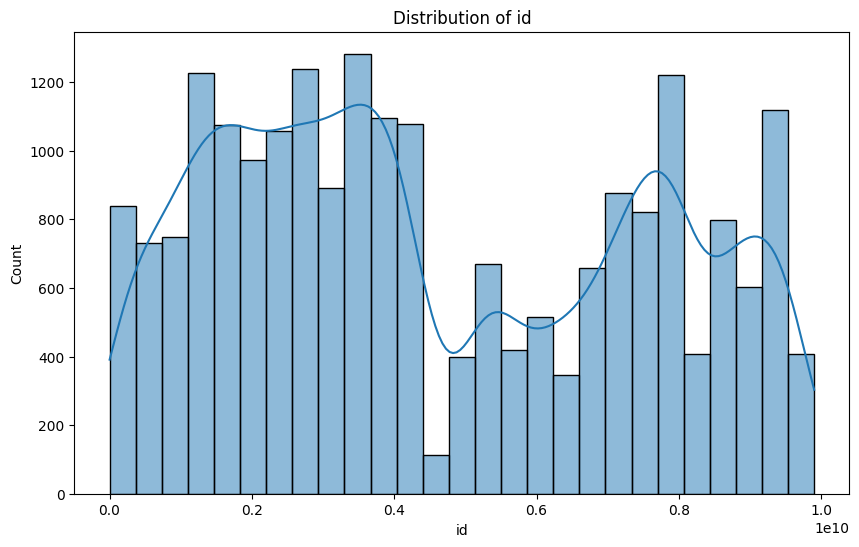

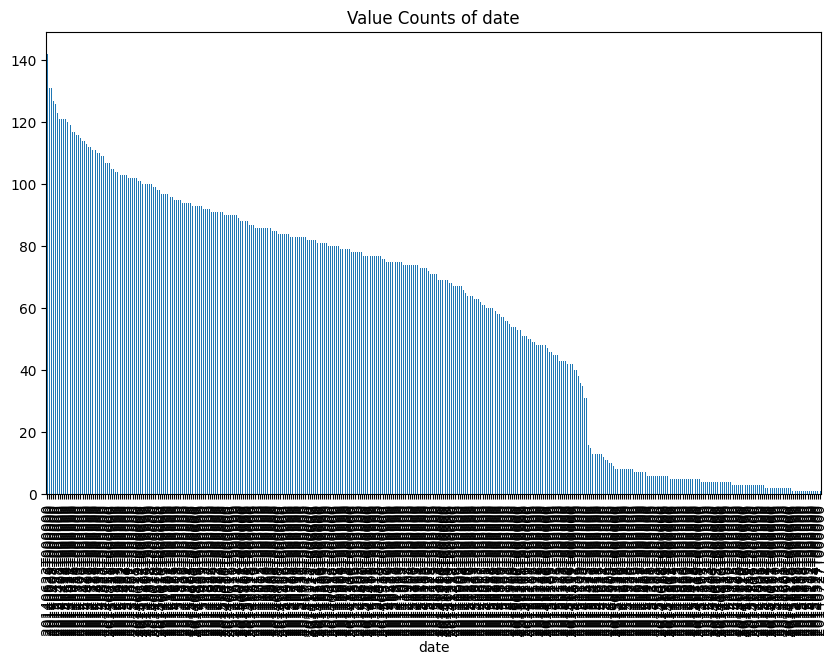

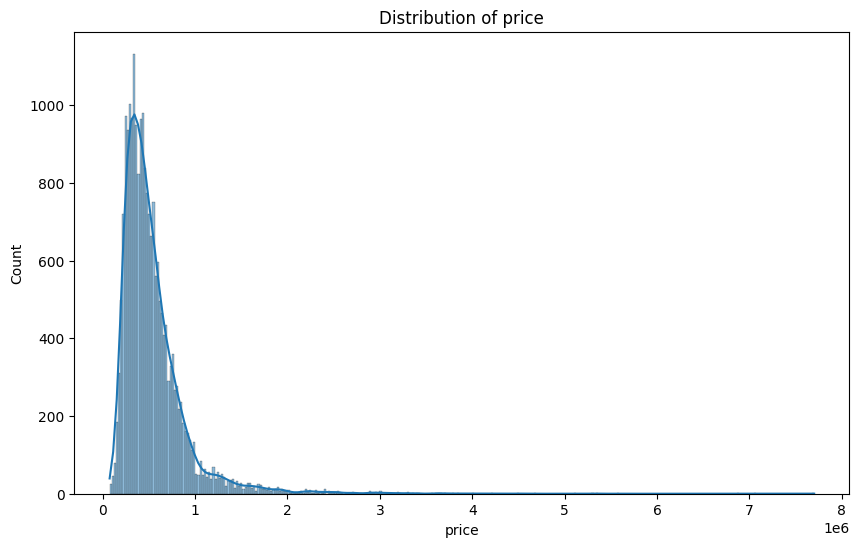

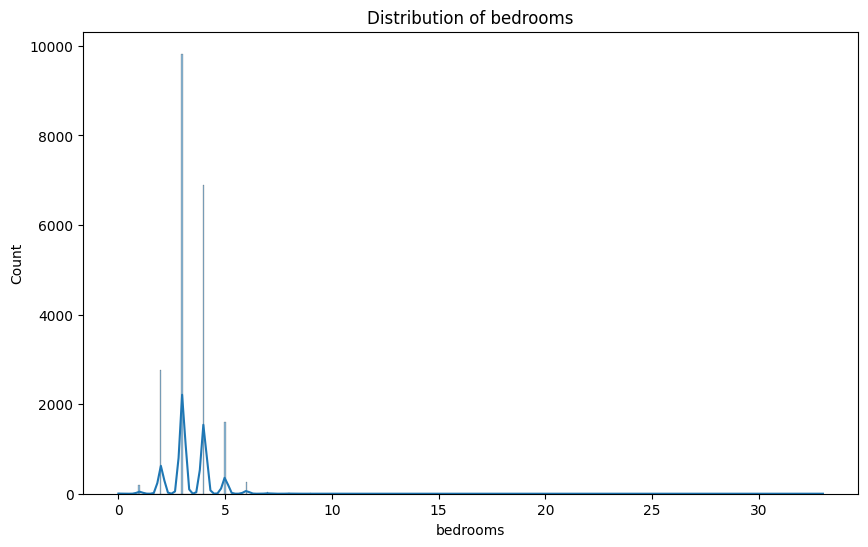

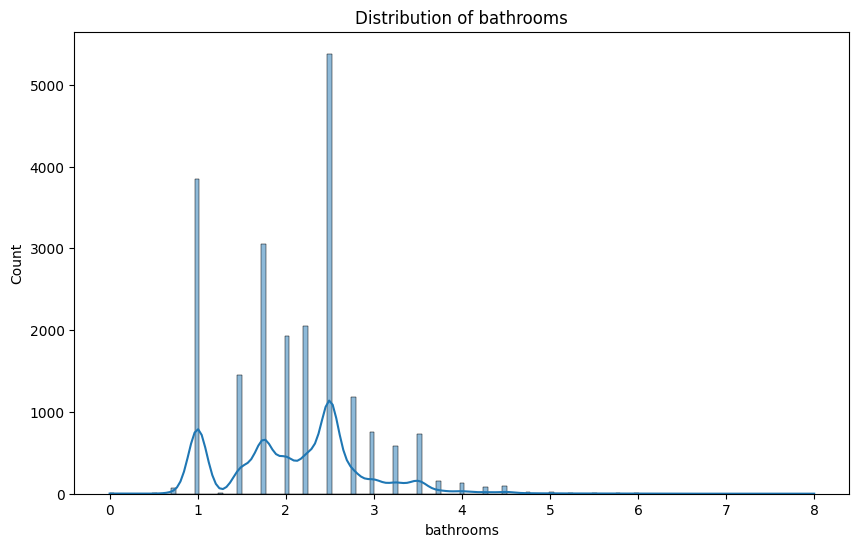

...

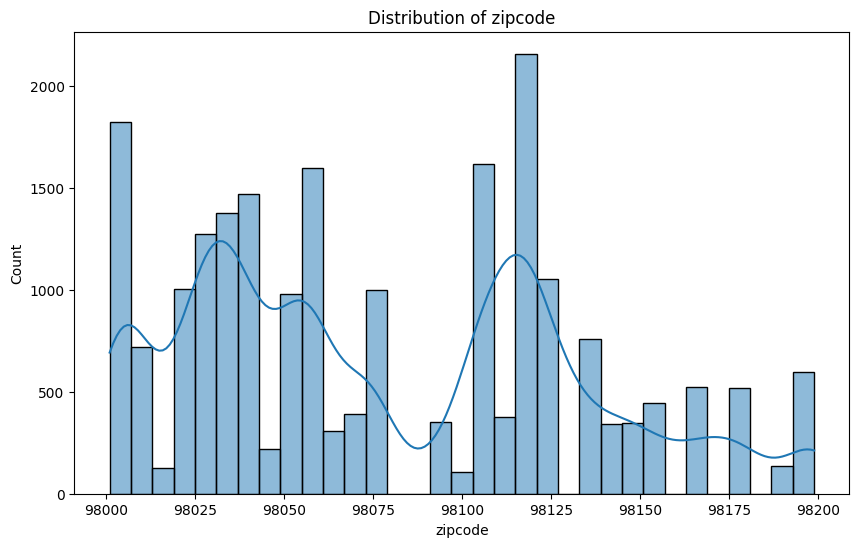

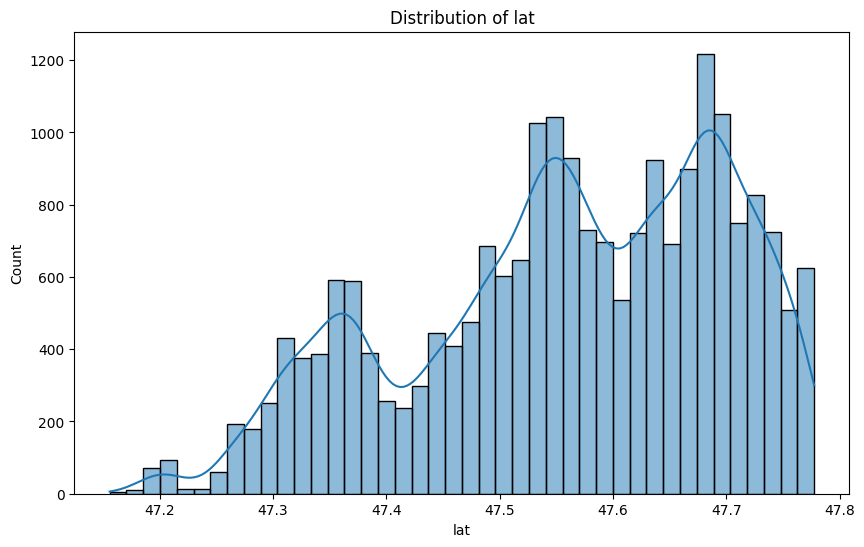

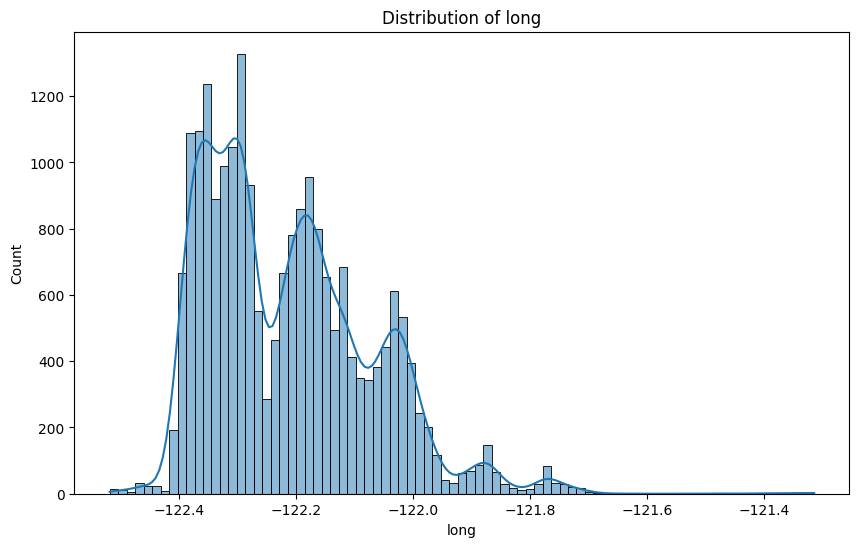

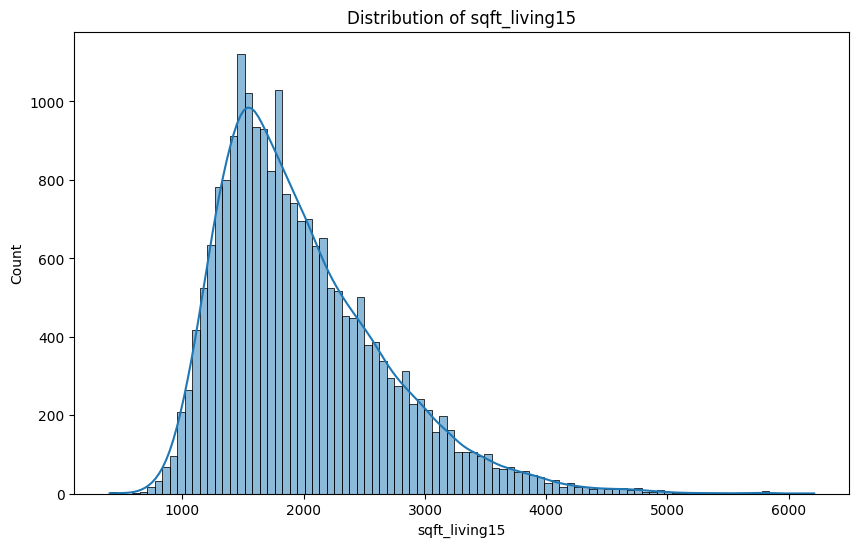

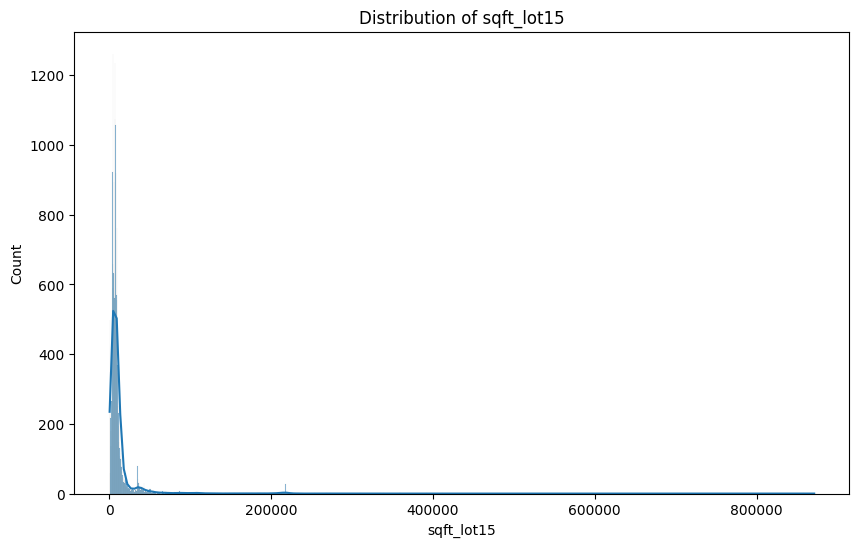

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

In [3]:
# plot show  for all datatypes [int, float, str] 

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
# Create a dictionary to store the plots for different data types
plots = {}

# Iterate through the columns of the DataFrame
for col in df.columns:
    # Determine the data type of the column
    dtype = df[col].dtype

    # Create the plot based on the data type
    if dtype in [np.int64, np.int32, np.int16, np.int8]:
        plots[col] = plt.figure(figsize=(10,6))
        sns.histplot(data=df, x=col, kde=True)
        plt.title(f"Distribution of {col}")
    elif dtype in [np.float64, np.float32, np.float16]:
        plots[col] = plt.figure(figsize=(10,6))
        sns.histplot(data=df, x=col, kde=True)
        plt.title(f"Distribution of {col}")
    elif dtype == object:
      plots[col] = plt.figure(figsize=(10,6))
      df[col].value_counts().plot(kind='bar')
      plt.title(f"Value Counts of {col}")


    else:
        print(f"Unsupported data type for column {col}: {dtype}")

# Display all the plots
for col, plot in plots.items():
  plt.figure(figsize=(10,6))
  plt.show(plot)

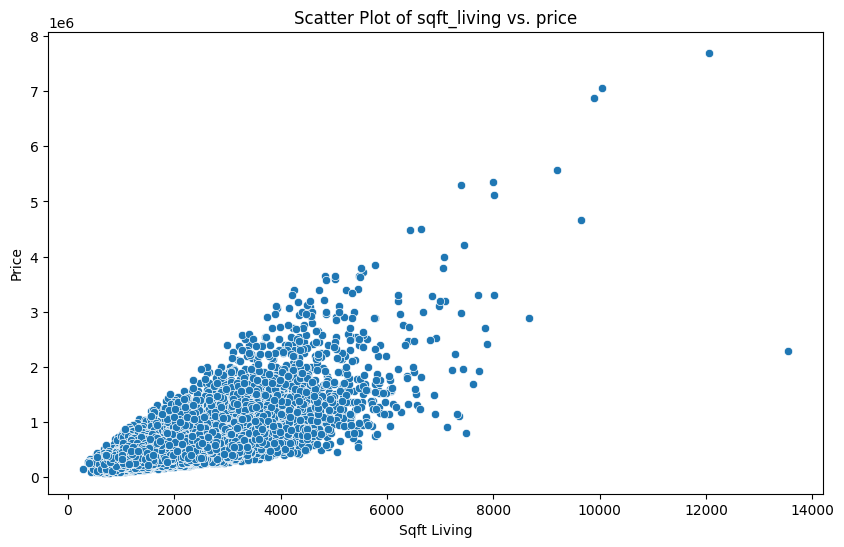

In [4]:
# Scatter plot for 'sqft_living', 'price'
plt.figure(figsize=(10, 6))
sns.scatterplot(x='sqft_living', y='price', data=df)
plt.title('Scatter Plot of sqft_living vs. price')
plt.xlabel('Sqft Living')
plt.ylabel('Price')
plt.show()

### Simple regression model that predicts price from square feet

Mean Squared Error: 76484977594.78207
Root Mean Squared Error: 276559.1755751056
Model Coefficients: [279.55477851]
Model Intercept: -41999.18454231194


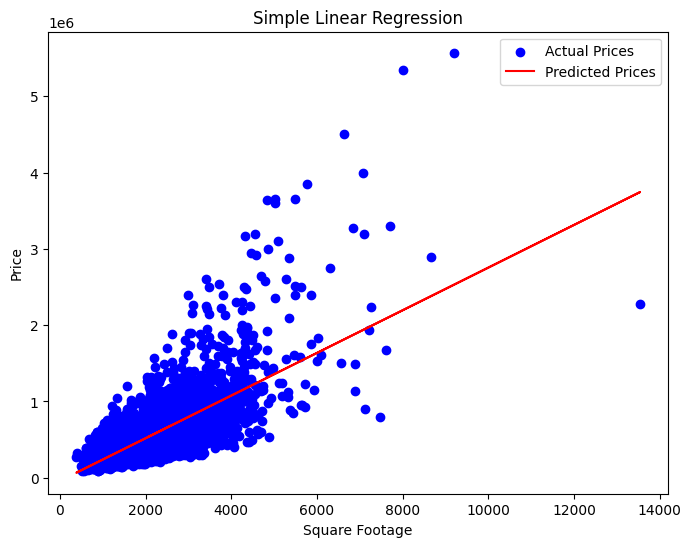

In [5]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

# Prepare the data
X = df[['sqft_living']]  # Features (square footage)
y = df['price']  # Target variable (price)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and train the linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
print(f"Mean Squared Error: {mse}")
print(f"Root Mean Squared Error: {rmse}")

# You can further analyze the model by examining coefficients, intercept, and plotting the regression line
print(f"Model Coefficients: {model.coef_}")
print(f"Model Intercept: {model.intercept_}")

# Plot the regression line (optional)
plt.figure(figsize=(8, 6))
plt.scatter(X_test, y_test, color='blue', label='Actual Prices')
plt.plot(X_test, y_pred, color='red', label='Predicted Prices')
plt.xlabel('Square Footage')
plt.ylabel('Price')
plt.title('Simple Linear Regression')
plt.legend()
plt.show()


In [6]:
print(model.coef_)
print(model.intercept_)

[279.55477851]
-41999.18454231194


### Explore other features of the data

In [7]:
my_features = ['bedrooms','bathrooms','sqft_living','sqft_lot','floors','zipcode']

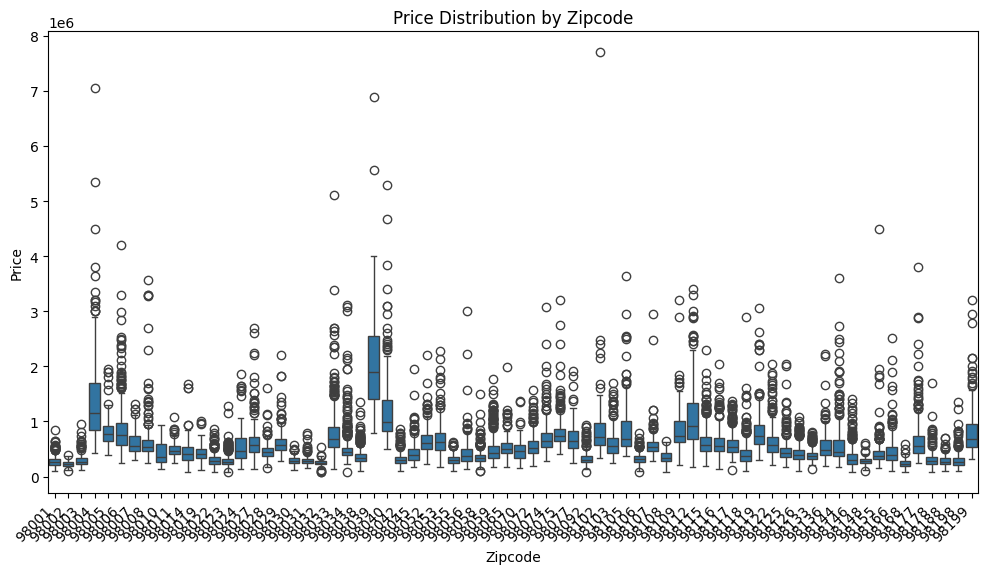

In [8]:
# plot show show(sales['zipcode'],sales['price'])
plt.figure(figsize=(12, 6))
sns.boxplot(x=df['zipcode'], y=df['price']) # Replace sales with your dataframe name df
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.title('Price Distribution by Zipcode')
plt.xlabel('Zipcode')
plt.ylabel('Price')
plt.show()

In [9]:
X = df[my_features]
y = df['price']  # Target variable (price)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
model = LinearRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

In [10]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
print(f"Mean Squared Error: {mse}")
print(f"Root Mean Squared Error: {rmse}")
print(f"Model Coefficients: {model.coef_}")
print(f"Model Intercept: {model.intercept_}")


Mean Squared Error: 73287796419.75934
Root Mean Squared Error: 270717.1889994415
Model Coefficients: [-5.66723924e+04  1.65476422e+04  3.13063049e+02 -3.20232174e-01
 -5.76662072e+03  5.81860332e+02]
Model Intercept: -57009888.539608456


# Apply learned models to make predictions

In [11]:
house1 = df[df['id']== 5631500400 ]
house1

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
2,5631500400,20150225T000000,180000,2,1.0,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062


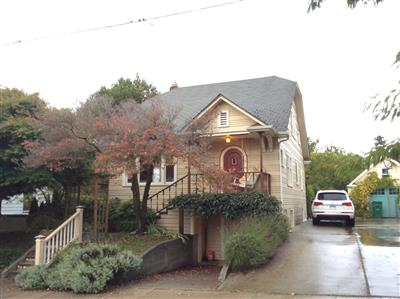


In [12]:
# Prepare the features for house1 for prediction
house1_features = house1[my_features]

# Make the prediction
predicted_price = model.predict(house1_features)

print(f"Predicted price for house1: {predicted_price[0]}")

Predicted price for house1: 164008.51426316053


In [13]:
house2 = df[df['id']== 1925069082]
house2

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
1361,1925069082,20150511T000000,2200000,5,4.25,4640,22703,2.0,1,4,...,8,2860,1780,1952,0,98052,47.6393,-122.097,3140,14200


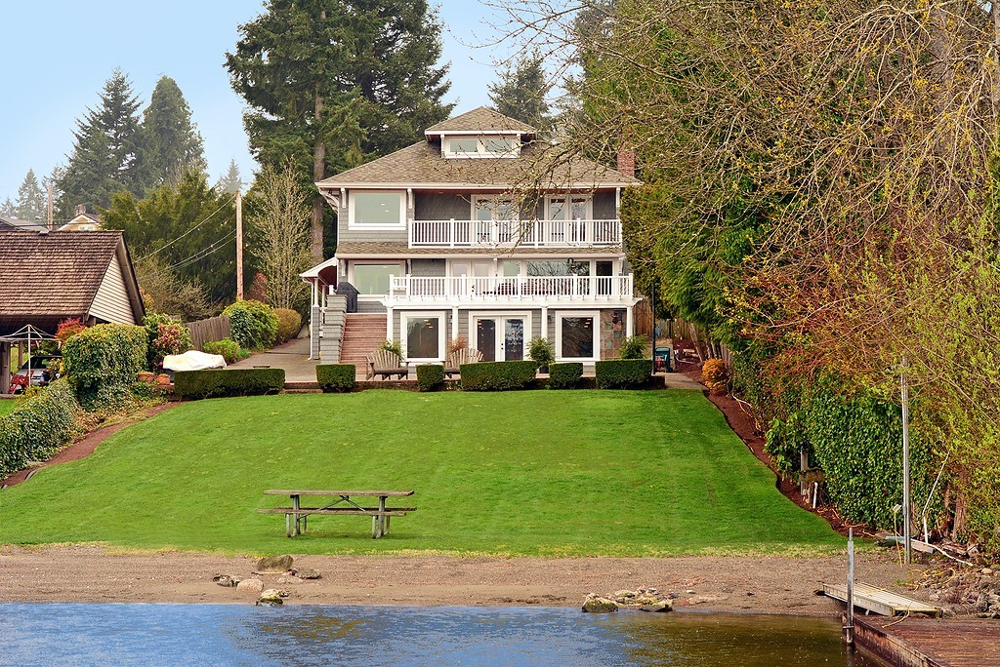

In [14]:
# Prepare the features for house1 for prediction
house2_features = house2[my_features]

# Make the prediction
predicted_price = model.predict(house2_features)

print(f"Predicted price for house2: {predicted_price[0]}")

Predicted price for house2: 1263455.2930987924


### More cases to predict

In [15]:
bill_gates = pd.DataFrame({'bedrooms':[8],
              'bathrooms':[25],
              'sqft_living':[50000],
              'sqft_lot':[225000],
              'floors':[4],
              'zipcode':['98039'],
              'condition':[10],
              'grade':[10],
              'waterfront':[1],
              'view':[4],
              'sqft_above':[37500],
              'sqft_basement':[12500],
              'yr_built':[1994],
              'yr_renovated':[2010],
              'lat':[47.627606],
              'long':[-122.242054],
              'sqft_living15':[5000],
              'sqft_lot15':[40000]})

In [16]:
bill_gates_features = bill_gates[my_features]

# Make the prediction
predicted_price = model.predict(bill_gates_features)

print(f"Predicted price for Bill Gates' house: {predicted_price[0]}")

Predicted price for Bill Gates' house: 15553462.175941981


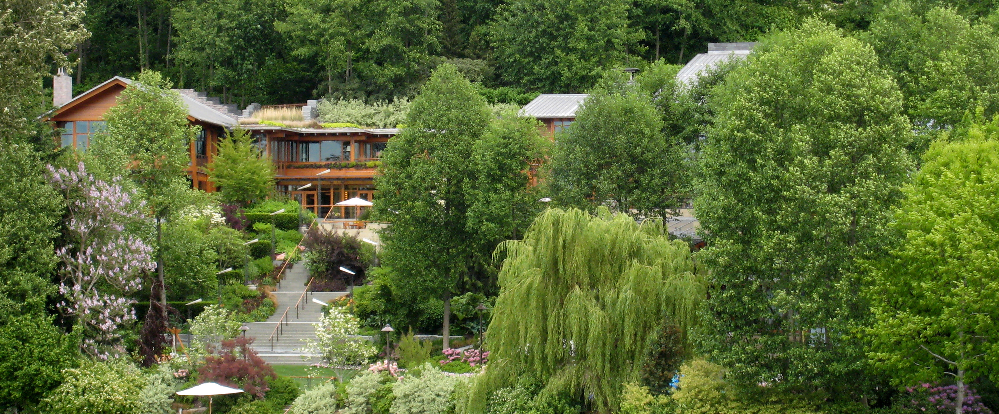

Q: We found the zip code with the highest average house price. What is the average house price of that zip code?

In [17]:
# Group by zipcode and calculate the average price
zipcode_avg_price = df.groupby('zipcode')['price'].mean()

# Find the zipcode with the highest average price
highest_avg_price_zip = zipcode_avg_price.idxmax()

# Get the average house price for that zip code
average_price = zipcode_avg_price.loc[highest_avg_price_zip]

print(f"The zip code with the highest average house price is: {highest_avg_price_zip}")
print(f"The average house price for zip code {highest_avg_price_zip} is: {average_price}")

The zip code with the highest average house price is: 98039
The average house price for zip code 98039 is: 2160606.6


Q: What fraction of the houses have living space between 2000 sq.ft. and 4000 sq.ft.?

In [18]:
# Calculate the fraction of houses with living space between 2000 and 4000 sq.ft.
living_space_fraction = len(df[(df['sqft_living'] >= 2000) & (df['sqft_living'] <= 4000)]) / len(df)

print(f"Fraction of houses with living space between 2000 and 4000 sq.ft.: {living_space_fraction}")


Fraction of houses with living space between 2000 and 4000 sq.ft.: 0.4266413732475825
